# Testing different regression methods

In [1]:
here::i_am("rna_atac/dimensionality_reduction/WNN.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(Seurat))

BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 24

# Multi core using future - built in to seurat
plan("multicore", workers = 24)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code



In [43]:
args = list()
# RNA
args$rna_metadata = file.path(io$basedir, 'results/rna/doublet_detection/sample_metadata_after_doublets.txt.gz')
args$rna_sce = file.path(io$basedir, 'processed/rna/SingleCellExperiment.rds')
args$regressed_logcounts = file.path(io$basedir, 'results/rna/regression/logcounts_regressed.txt.gz')
args$rna_nfeatures = 4000
args$vars_to_regress = c("nFeature_RNA", "nCount_RNA", "mitochondrial_percent_RNA", "ribosomal_percent_RNA")
args$rna_npcs = 30
# outdir
args$outdir = file.path(io$basedir, 'results/rna/dimensionality_reduction/sce/regression/')
dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

#### Load data

In [3]:
##########################
## Load sample metadata ##
##########################
metadata_rna <- fread(args$rna_metadata) %>%
  .[pass_rnaQC==TRUE & doublet_call==FALSE] %>% 
  .[,exp := str_replace_all(sample, opts$sample2exp)]

In [4]:
##############################
## Load RNA expression data ##
##############################

rna.sce <- load_SingleCellExperiment(args$rna_sce, normalise = TRUE, cells = metadata_rna$cell)

# Add sample metadata to the colData of the SingleCellExperiment
colData(rna.sce) <- metadata_rna %>% as.data.frame %>% tibble::column_to_rownames("cell") %>%
  .[colnames(rna.sce),] %>% DataFrame()

# Filter features manually
rna.sce <- rna.sce[grep("*Rik|^Gm|^Mt-|^Rps|^Rpl|^Olfr",rownames(rna.sce), invert=T),]


In [5]:
# Remove genes with very low variance
gene_vars = rowVars(logcounts(rna.sce))
names(gene_vars) = rownames(rna.sce)
keep_genes = names(gene_vars[gene_vars>0.1])
rna.sce = rna.sce[keep_genes, ]

#### Feature selection & PCA based on regressed log counts outside of seurat

In [6]:
logcounts_regressed.mtx <- fread(args$regressed_logcounts)

In [7]:
logcounts_regressed.mtx = as.matrix(logcounts_regressed.mtx)

In [8]:
rownames(logcounts_regressed.mtx) = rownames(rna.sce)

In [9]:
logcounts(rna.sce) = logcounts_regressed.mtx

In [30]:
# Feature selection based on regressed log counts
rna_features <- modelGeneVar(rna.sce, block=metadata_rna$exp) %>% as.data.table(keep.rownames = T) %>%
  setnames("rn","gene") %>%
  .[mean>=0.001] %>% setorder(FDR) %>% head(args$rna_nfeatures) %>% .$gene

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


In [31]:
sce_filt = rna.sce[rna_features,]

In [32]:
sce_filt

class: SingleCellExperiment 
dim: 4000 38346 
metadata(0):
assays(2): counts logcounts
rownames(4000): Ube2w Klf7 ... Cyth1 Med24
rowData names(0):
colnames(38346): 1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1
  1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1 ...
  rv_eo_deg_day4_dtag#TTTGTGTTCATTTGTC-1
  rv_eo_deg_day4_dtag#TTTGTTGGTACTTAGG-1
colData names(13): barcode sample ... doublet_call exp
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

In [33]:
sce_filt <- runPCA(sce_filt, ncomponents = args$rna_npcs, ntop=args$rna_nfeatures)

In [34]:
sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = 25, min_dist = 0.3)

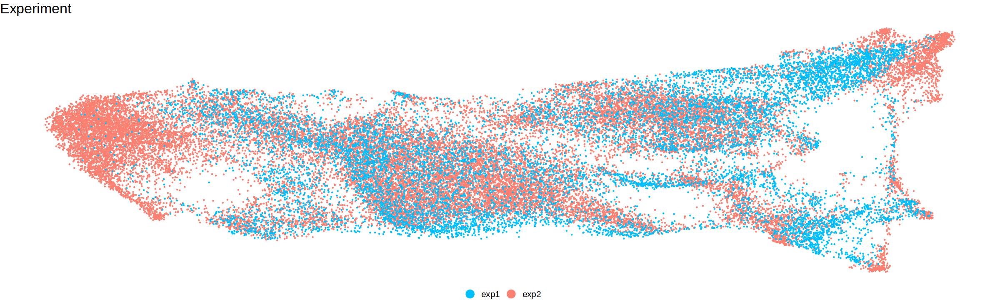

In [165]:
# Fetch UMAP coordinates
umap.dt <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)] %>%
  setnames(c("UMAP1","UMAP2","cell")) %>%
  merge(.,metadata_rna, by='cell') %>%
    .[, UMAP1:=UMAP1*-1] # invert UMAP1 to make it follow chronological time

dot_size = 5
text_size = 15
title_size = 20

# Plot umap
p1 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=exp)) + 
    geom_point(size=0.2) + 
    scale_color_manual(values=c('exp1' = 'deepskyblue', 'exp2' = 'salmon'), name='') +
    guides(colour = guide_legend(override.aes = list(size=dot_size))) + 
    ggtitle('Experiment') +
    theme_void() +
    theme(text=element_text(size=text_size), 
         plot.title=element_text(size=title_size), 
         legend.position='bottom')
p1

In [166]:
umap.dt$day_genotype = paste0(umap.dt$day, '-', umap.dt$genotype)
umap.dt$day_genotype = gsub('wt', 'WT', umap.dt$day_genotype)
umap.dt$day_genotype = gsub('eomes_ko', 'KD', umap.dt$day_genotype)
umap.dt$day_genotype = factor(umap.dt$day_genotype, levels=c('D3-WT','D3.5-WT','D3.5-KD','D4-WT','D4-KD','D4.5-WT','D4.5-KD','D5-WT','D5-KD'))

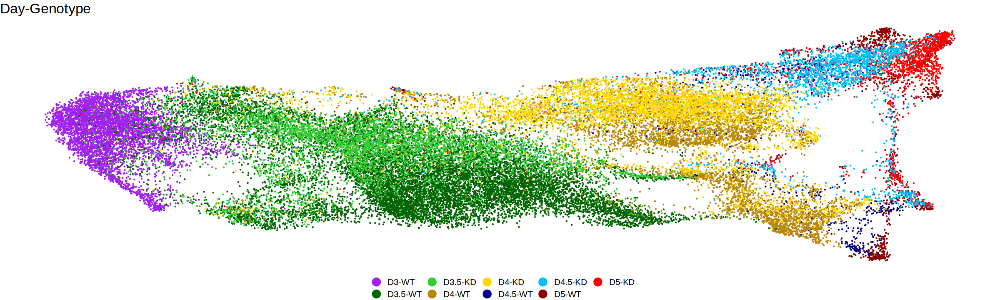

In [167]:
# Plot umap
p2 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=day_genotype)) + 
    geom_point(size=0.2) + 
    scale_color_manual(values=c('D3-WT' = 'purple', 
                                'D3.5-WT' = 'darkgreen', 
                                'D3.5-KD' = 'limegreen',
                                'D4-WT' = 'darkgoldenrod', 
                                'D4-KD' = 'gold',
                                'D4.5-WT' = 'darkblue',
                                'D4.5-KD' = 'deepskyblue', 
                                'D5-WT' = 'darkred',
                                'D5-KD' = 'red'
                               ), name='') +
    guides(colour = guide_legend(override.aes = list(size=dot_size))) + 
    ggtitle('Day-Genotype') +
    theme_void() +
    theme(text=element_text(size=text_size), 
         plot.title=element_text(size=title_size), 
         legend.position='bottom')
p2

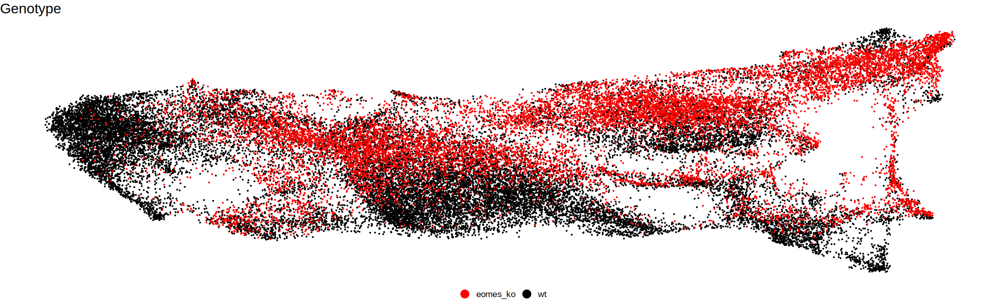

In [168]:
# Plot umap
p3 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=genotype)) + 
    geom_point(size=0.2) + 
    scale_color_manual(values=c('wt' = 'black', 'eomes_ko' = 'red'), name='') + 
    guides(colour = guide_legend(override.aes = list(size=dot_size))) + 
    ggtitle('Genotype') +
    theme_void() +
    theme(text=element_text(size=text_size), 
         plot.title=element_text(size=title_size), 
         legend.position='bottom')
p3

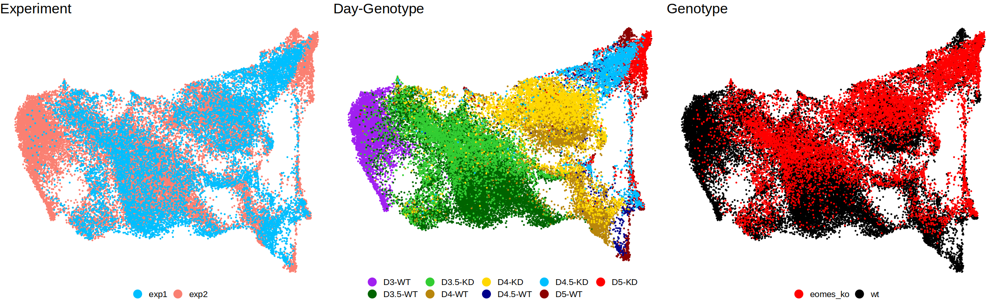

In [169]:
options(repr.plot.width=20, repr.plot.height=6)
ggarrange(p1, p2, p3, ncol=3)

In [170]:
pdf(sprintf('%s/regressed_umap_feature%s_pcs%s.pdf', args$outdir, args$rna_npcs, args$rna_nfeatures), width=15, height=5)
    ggarrange(p1, p2, p3, ncol=3)
dev.off()

png 
  2

In [163]:
pca.dt <- reducedDim(sce_filt,"PCA") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)]
fwrite(pca.dt, sprintf('%s/regressed_pca_feature%s_pcs%s.txt.gz', args$outdir, args$rna_nfeatures, args$rna_npcs))

In [164]:
umap.dt <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)] %>%
  setnames(c("UMAP1","UMAP2","cell"))
fwrite(umap.dt, sprintf('%s/regressed_umap_feature%s_pcs%s.txt.gz', args$outdir, args$rna_nfeatures, args$rna_npcs))

In [174]:
plot_umap = function(umap.dt){

dot_size = 5
text_size = 15
title_size = 20

# Plot umap
p1 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=exp)) + 
    geom_point(size=0.2) + 
    scale_color_manual(values=c('exp1' = 'deepskyblue', 'exp2' = 'salmon'), name='') +
    guides(colour = guide_legend(override.aes = list(size=dot_size))) + 
    ggtitle('Experiment') +
    theme_void() +
    theme(text=element_text(size=text_size), 
         plot.title=element_text(size=title_size), 
         legend.position='bottom')

umap.dt$day_genotype = paste0(umap.dt$day, '-', umap.dt$genotype)
umap.dt$day_genotype = gsub('wt', 'WT', umap.dt$day_genotype)
umap.dt$day_genotype = gsub('eomes_ko', 'KD', umap.dt$day_genotype)
umap.dt$day_genotype = factor(umap.dt$day_genotype, levels=c('D3-WT','D3.5-WT','D3.5-KD','D4-WT','D4-KD','D4.5-WT','D4.5-KD','D5-WT','D5-KD'))

# Plot umap
p2 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=day_genotype)) + 
    geom_point(size=0.2) + 
    scale_color_manual(values=c('D3-WT' = 'purple', 
                                'D3.5-WT' = 'darkgreen', 
                                'D3.5-KD' = 'limegreen',
                                'D4-WT' = 'darkgoldenrod', 
                                'D4-KD' = 'gold',
                                'D4.5-WT' = 'darkblue',
                                'D4.5-KD' = 'deepskyblue', 
                                'D5-WT' = 'darkred',
                                'D5-KD' = 'red'
                               ), name='') +
    guides(colour = guide_legend(override.aes = list(size=dot_size))) + 
    ggtitle('Day-Genotype') +
    theme_void() +
    theme(text=element_text(size=text_size), 
         plot.title=element_text(size=title_size), 
         legend.position='bottom')

# Plot umap
p3 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=genotype)) + 
    geom_point(size=0.2) + 
    scale_color_manual(values=c('wt' = 'black', 'eomes_ko' = 'red'), name='') + 
    guides(colour = guide_legend(override.aes = list(size=dot_size))) + 
    ggtitle('Genotype') +
    theme_void() +
    theme(text=element_text(size=text_size), 
         plot.title=element_text(size=title_size), 
         legend.position='bottom')

plots = ggarrange(p1, p2, p3, ncol=3)
return(plots)
}

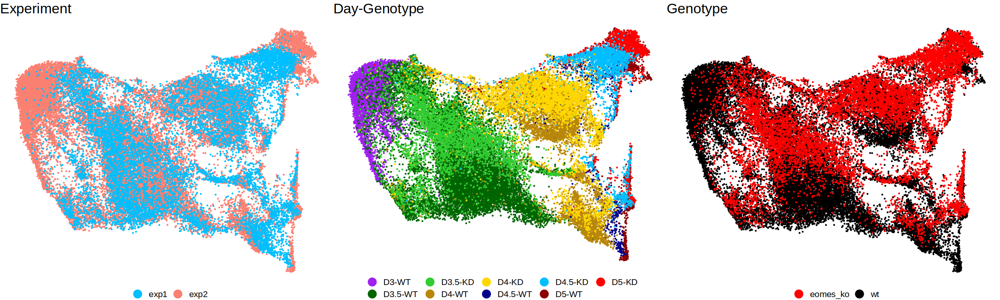

In [180]:
sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = 25, min_dist = 0.3, metric='cosine')
# Fetch UMAP coordinates
umap.dt <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)] %>%
  setnames(c("UMAP1","UMAP2","cell")) %>%
  merge(.,metadata_rna, by='cell') %>%
    .[, UMAP1:=UMAP1*-1] # invert UMAP1 to make it follow chronological time
plot_umap(umap.dt)

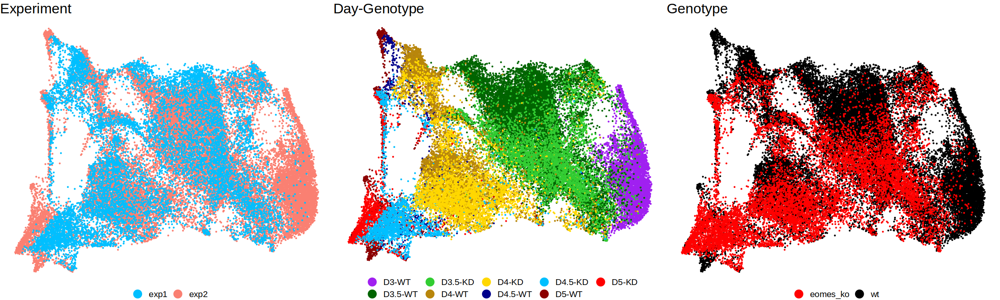

In [181]:
sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = 25, min_dist = 0.3, metric='manhattan')
# Fetch UMAP coordinates
umap.dt <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)] %>%
  setnames(c("UMAP1","UMAP2","cell")) %>%
  merge(.,metadata_rna, by='cell') %>%
    .[, UMAP1:=UMAP1*-1] # invert UMAP1 to make it follow chronological time
plot_umap(umap.dt)

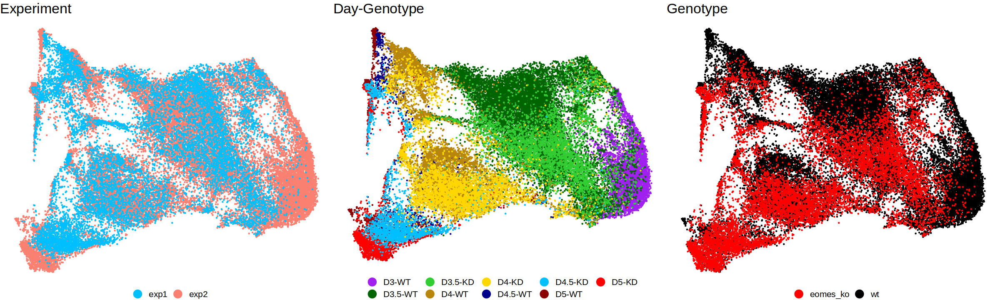

In [182]:
sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = 25, min_dist = 0.3, metric='correlation')
# Fetch UMAP coordinates
umap.dt <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)] %>%
  setnames(c("UMAP1","UMAP2","cell")) %>%
  merge(.,metadata_rna, by='cell') %>%
    .[, UMAP1:=UMAP1*-1] # invert UMAP1 to make it follow chronological time
plot_umap(umap.dt)

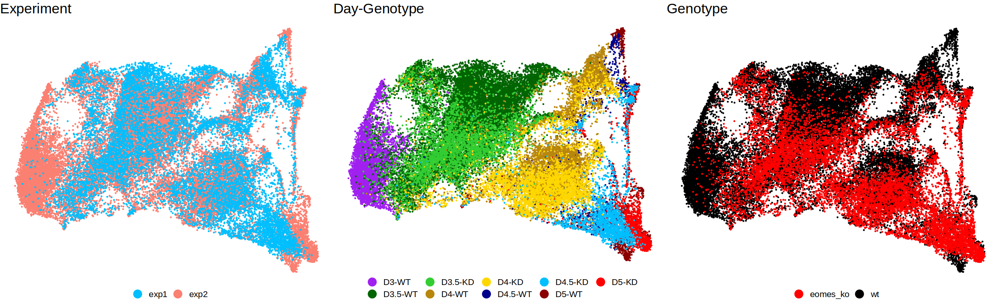

In [183]:
sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = 25, min_dist = 0.3, metric='euclidean')
# Fetch UMAP coordinates
umap.dt <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)] %>%
  setnames(c("UMAP1","UMAP2","cell")) %>%
  merge(.,metadata_rna, by='cell') %>%
    .[, UMAP1:=UMAP1*-1] # invert UMAP1 to make it follow chronological time
plot_umap(umap.dt)

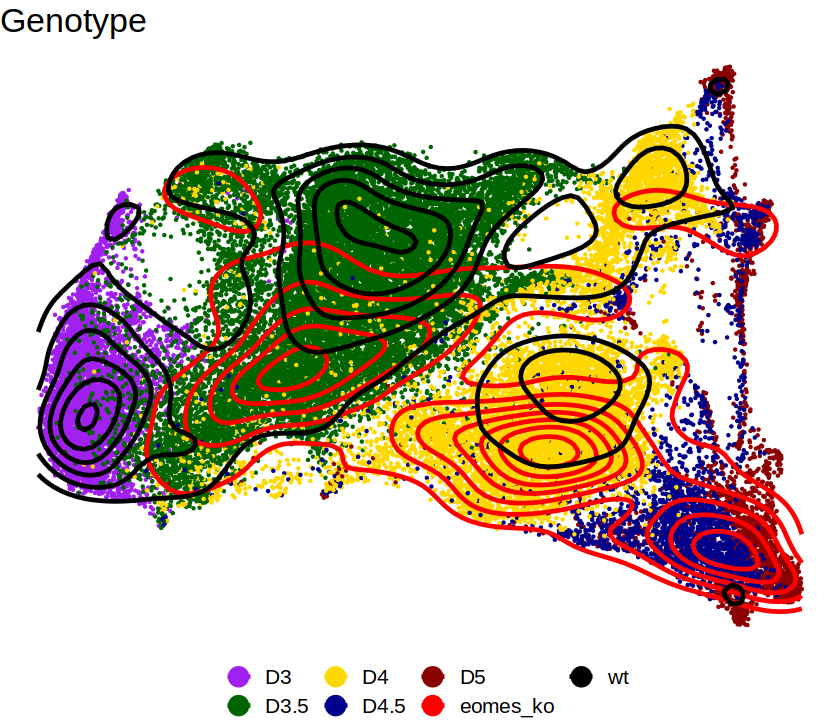

In [200]:
options(repr.plot.width=7, repr.plot.height=6)
ggplot(umap.dt, aes(UMAP1, UMAP2)) + 
    geom_point(size=0.2, aes(col=day)) + 
    geom_density_2d(aes(col=genotype), linewidth=1) +
    scale_color_manual(values=c('wt' = 'black', 'eomes_ko' = 'red',
                               'D3'= 'purple', 'D3.5' = 'darkgreen', 'D4'= 'gold', 'D4.5' = 'darkblue', 'D5'= 'darkred'), name='') + 
    guides(colour = guide_legend(override.aes = list(size=dot_size))) + 
    ggtitle('Genotype') +
    theme_void() +
    theme(text=element_text(size=text_size), 
         plot.title=element_text(size=title_size), 
         legend.position='bottom')